In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/organizations/nih-chest-xrays/data/LOG_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/README_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/BBox_List_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/test_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/ARXIV_V5_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/train_val_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/FAQ_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png
/kaggle/inpu

In [52]:
import os
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,classification_report,confusion_matrix


import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [3]:
DATA_ROOT = "/kaggle/input/nih-chest-xrays"

In [4]:
for root, dirs, files in os.walk(DATA_ROOT):
    for f in files:
        if f.endswith(".csv"):
            print(os.path.join(root, f))

In [5]:
df = pd.read_csv(f"/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv")

df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [6]:
print(df.shape)

(112120, 12)


In [7]:
df["Target"] = df["Finding Labels"].apply(
    lambda labels: 1 if "Pneumonia" in str(labels).split("|") else 0
)

print(df["Target"].value_counts())

Target
0    110689
1      1431
Name: count, dtype: int64


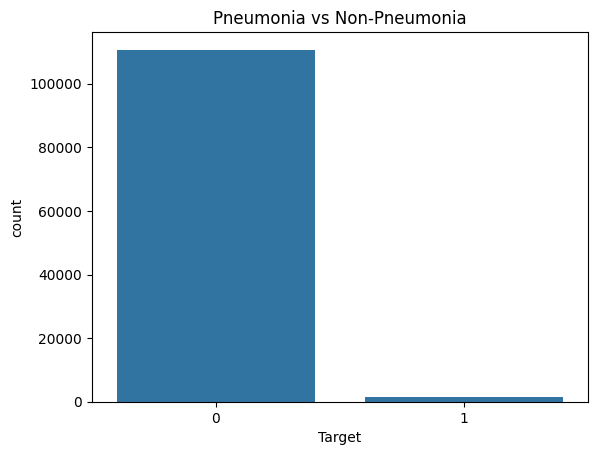

In [8]:
sns.countplot(x="Target", data=df)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [9]:
pneumonia_df = df[df["Target"] == 1]

non_pneumonia_df = df[df["Target"] == 0].sample(
    n=len(pneumonia_df) * 2,
    random_state=42
)

df_balanced = pd.concat([pneumonia_df, non_pneumonia_df])
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

print(df_balanced["Target"].value_counts())

Target
0    2862
1    1431
Name: count, dtype: int64


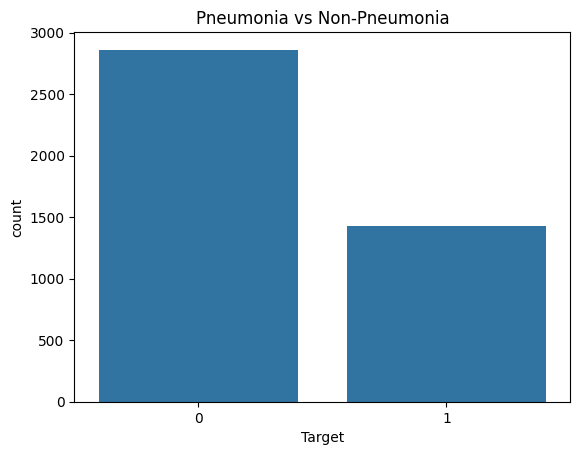

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(x="Target", data=df_balanced)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [11]:
DATA_ROOT = "/kaggle/input/datasets/organizations/nih-chest-xrays/data"

In [12]:
import os

all_images = []

for root, dirs, files in os.walk(DATA_ROOT):
    for file in files:
        if file.endswith(".png"):
            all_images.append(os.path.join(root, file))

print("Total images found:", len(all_images))
print(all_images[:5])

Total images found: 112120
['/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004186_007.png']


In [16]:
image_path_map = {os.path.basename(x): x for x in all_images}

df_balanced["path"] = df_balanced["Image Index"].map(image_path_map)
df_balanced = df_balanced.dropna(subset=["path"]).reset_index(drop=True)

print(df_balanced.shape)
print(df_balanced["path"].isnull().sum())
df_balanced[["Image Index", "path"]].head()

(4293, 14)
0


,Image Index,path
0,00018472_001.png,/kaggle/input/datasets/organizations/nih-chest...
1,00000116_020.png,/kaggle/input/datasets/organizations/nih-chest...
2,00002003_002.png,/kaggle/input/datasets/organizations/nih-chest...
3,00016490_019.png,/kaggle/input/datasets/organizations/nih-chest...
4,00026050_010.png,/kaggle/input/datasets/organizations/nih-chest...


In [17]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(
    df_balanced,
    test_size=0.3,
    stratify=df_balanced["Target"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df["Target"],
    random_state=42
)

print("Train shape:", train_df.shape)
print("Validation shape:", val_df.shape)
print("Test shape:", test_df.shape)

Train shape: (3005, 14)
Validation shape: (644, 14)
Test shape: (644, 14)


In [18]:
print("Train target distribution:")
print(train_df["Target"].value_counts())

print("\nValidation target distribution:")
print(val_df["Target"].value_counts())

print("\nTest target distribution:")
print(test_df["Target"].value_counts())

Train target distribution:
Target
0    2003
1    1002
Name: count, dtype: int64

Validation target distribution:
Target
0    429
1    215
Name: count, dtype: int64

Test target distribution:
Target
0    430
1    214
Name: count, dtype: int64


In [19]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

In [20]:
def clahe_enhancement(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(gray)
    img = cv2.cvtColor(cl, cv2.COLOR_GRAY2RGB)
    return img

In [21]:
class ChestXrayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.loc[idx, "path"]
        label = self.dataframe.loc[idx, "Target"]

        image = Image.open(img_path).convert("RGB")
        image = np.array(image)

        image = clahe_enhancement(image)
        image = Image.fromarray(image)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.float32)

In [22]:
train_dataset = ChestXrayDataset(train_df, transform=train_transform)
val_dataset = ChestXrayDataset(val_df, transform=val_test_transform)
test_dataset = ChestXrayDataset(test_df, transform=val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print("Train dataset size:", len(train_dataset))
print("Validation dataset size:", len(val_dataset))
print("Test dataset size:", len(test_dataset))
print("Train batches:", len(train_loader))
print("Validation batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train dataset size: 3005
Validation dataset size: 644
Test dataset size: 644
Train batches: 94
Validation batches: 21
Test batches: 21


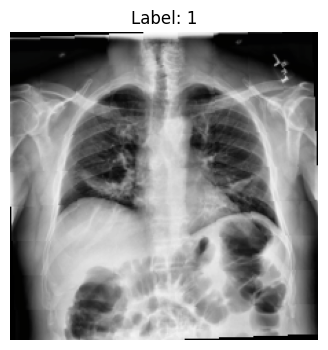

In [23]:
images, labels = next(iter(train_loader))

img = images[0].permute(1, 2, 0).numpy()
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)

plt.figure(figsize=(4,4))
plt.imshow(img)
plt.title(f"Label: {int(labels[0].item())}")
plt.axis("off")
plt.show()

In [24]:
import os

os.makedirs("/kaggle/working/processed_data", exist_ok=True)

train_df.to_csv("/kaggle/working/processed_data/train.csv", index=False)
val_df.to_csv("/kaggle/working/processed_data/val.csv", index=False)
test_df.to_csv("/kaggle/working/processed_data/test.csv", index=False)

print("Saved successfully to /kaggle/working/processed_data")

Saved successfully to /kaggle/working/processed_data


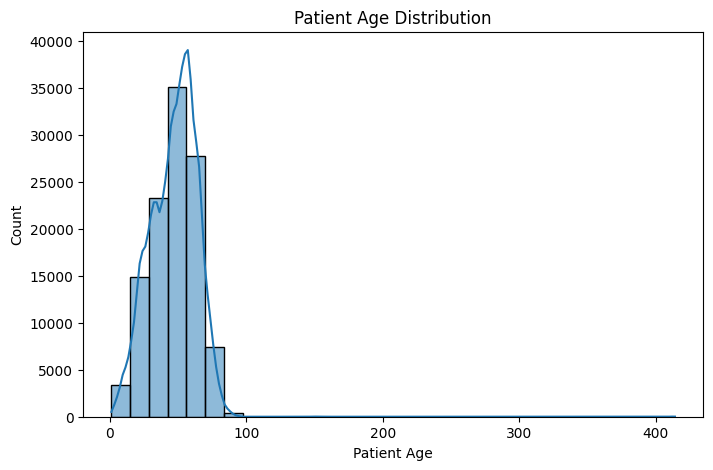

count    112120.000000
mean         46.901463
std          16.839923
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max         414.000000
Name: Patient Age, dtype: float64


In [25]:
plt.figure(figsize=(8,5))
sns.histplot(df["Patient Age"], bins=30, kde=True)
plt.title("Patient Age Distribution")
plt.show()

print(df["Patient Age"].describe())

Patient Gender
M    63340
F    48780
Name: count, dtype: int64


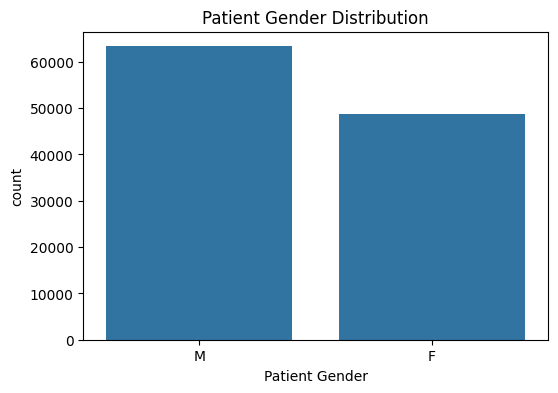

In [26]:
print(df["Patient Gender"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", data=df)
plt.title("Patient Gender Distribution")
plt.show()

View Position
PA    67310
AP    44810
Name: count, dtype: int64


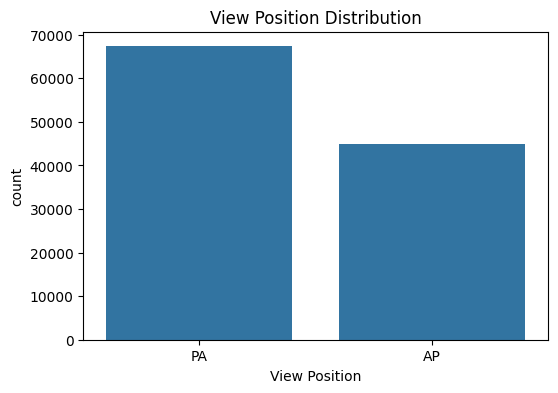

In [27]:
print(df["View Position"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="View Position", data=df)
plt.title("View Position Distribution")
plt.show()

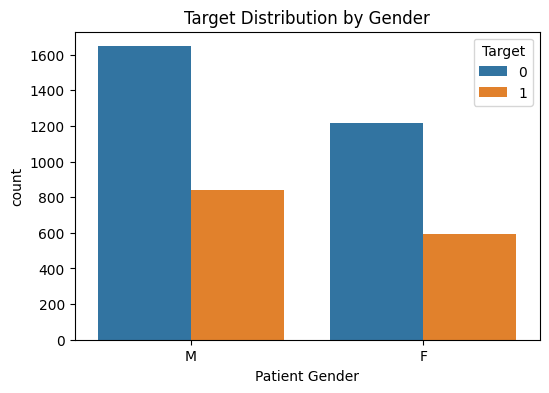

In [28]:
plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", hue="Target", data=df_balanced)
plt.title("Target Distribution by Gender")
plt.show()

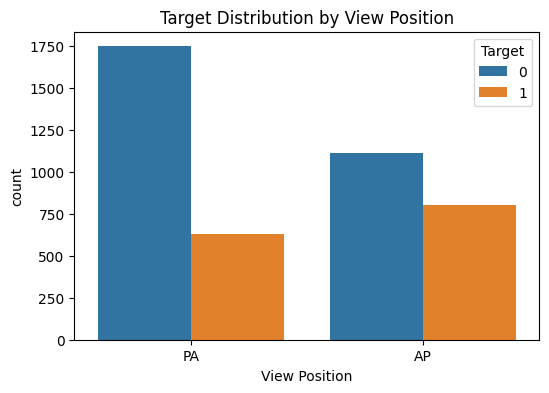

In [29]:
plt.figure(figsize=(6,4))
sns.countplot(x="View Position", hue="Target", data=df_balanced)
plt.title("Target Distribution by View Position")
plt.show()

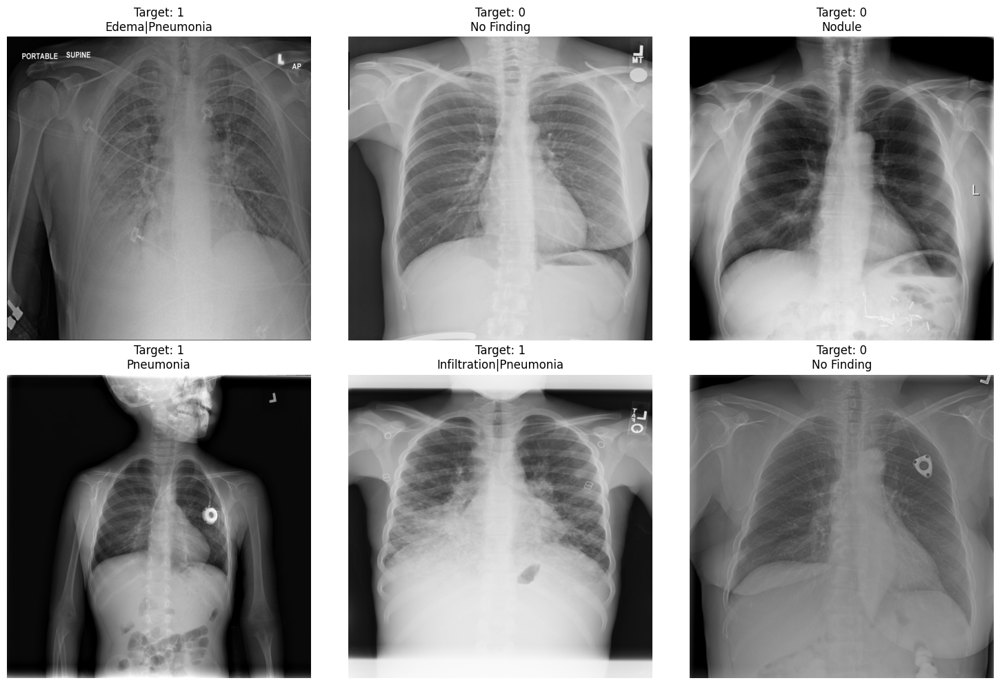

In [30]:
sample_rows = df_balanced.sample(6, random_state=42)

plt.figure(figsize=(15,10))
for i, (_, row) in enumerate(sample_rows.iterrows()):
    img = Image.open(row["path"]).convert("RGB")
    plt.subplot(2,3,i+1)
    plt.imshow(img, cmap="gray")
    plt.title(f'Target: {row["Target"]}\n{row["Finding Labels"]}')
    plt.axis("off")

plt.tight_layout()
plt.show()

In [31]:
print("EDA and preprocessing completed successfully.")
print("Final balanced dataset size:", df_balanced.shape)
print("Train set:", train_df.shape)
print("Validation set:", val_df.shape)
print("Test set:", test_df.shape)

EDA and preprocessing completed successfully.
Final balanced dataset size: (4293, 14)
Train set: (3005, 14)
Validation set: (644, 14)
Test set: (644, 14)


In [34]:
from torchvision import models
from torchvision.models import ViT_B_16_Weights

import torch
import torch.nn as nn

In [35]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

cuda


In [37]:
model = models.vit_b_16(
    weights=ViT_B_16_Weights.DEFAULT
)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:01<00:00, 176MB/s]  


In [38]:
for param in model.parameters():
    param.requires_grad = False

In [40]:
for param in model.encoder.layers[-1].parameters():
    param.requires_grad = True

In [42]:
model.heads.head = nn.Linear(
    model.heads.head.in_features,
    1
)

In [43]:
for param in model.heads.parameters():
    param.requires_grad = True

In [45]:
model = model.to(device)

In [46]:
pos_weight = torch.tensor([1.2]).to(device)

criterion = nn.BCEWithLogitsLoss(
    pos_weight=pos_weight
)

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4
)

In [47]:
def train_model(model, train_loader, val_loader, epochs=10):

    history = {
        "train_loss": [],
        "val_loss": []
    }

    for epoch in range(epochs):

        model.train()

        train_loss = 0

        for images, labels in train_loader:

            images = images.to(device)

            labels = labels.to(device).unsqueeze(1)

            optimizer.zero_grad()

            outputs = model(images)

            loss = criterion(outputs, labels)

            loss.backward()

            optimizer.step()

            train_loss += loss.item()

        model.eval()

        val_loss = 0

        with torch.no_grad():

            for images, labels in val_loader:

                images = images.to(device)

                labels = labels.to(device).unsqueeze(1)

                outputs = model(images)

                loss = criterion(outputs, labels)

                val_loss += loss.item()

        history["train_loss"].append(train_loss)

        history["val_loss"].append(val_loss)

        print(
            f"Epoch {epoch+1}/{epochs} | "
            f"Train Loss: {train_loss:.4f} | "
            f"Val Loss: {val_loss:.4f}"
        )

    return history

In [48]:
history = train_model(
    model,
    train_loader,
    val_loader,
    epochs=10
)

Epoch 1/10 | Train Loss: 64.0391 | Val Loss: 14.0879
Epoch 2/10 | Train Loss: 60.4158 | Val Loss: 13.9167
Epoch 3/10 | Train Loss: 60.6239 | Val Loss: 13.9369
Epoch 4/10 | Train Loss: 59.1023 | Val Loss: 13.9359
Epoch 5/10 | Train Loss: 57.3820 | Val Loss: 14.1277
Epoch 6/10 | Train Loss: 56.0403 | Val Loss: 13.8738
Epoch 7/10 | Train Loss: 54.4288 | Val Loss: 14.5496
Epoch 8/10 | Train Loss: 54.6364 | Val Loss: 14.8766
Epoch 9/10 | Train Loss: 51.1889 | Val Loss: 15.0413
Epoch 10/10 | Train Loss: 50.1816 | Val Loss: 16.2272


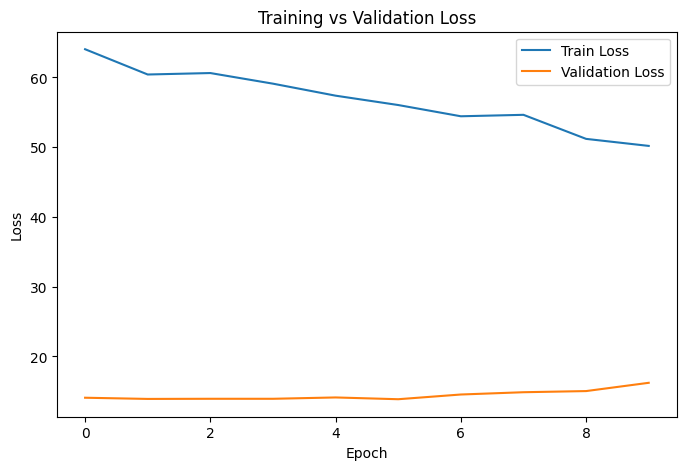

In [50]:
plt.figure(figsize=(8,5))
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [53]:
def get_probs(model, loader):

    model.eval()

    probs_all = []
    targets_all = []

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(device)

            outputs = model(images)

            probs = torch.sigmoid(outputs).cpu().numpy().flatten()

            probs_all.extend(probs)

            targets_all.extend(labels.numpy())

    return np.array(targets_all), np.array(probs_all)

In [54]:
targets, probs = get_probs(model, test_loader)

In [55]:
best_acc = 0
best_th = 0

for th in np.arange(0.3, 0.9, 0.05):

    preds = (probs > th).astype(int)

    acc = accuracy_score(targets, preds)

    f1 = f1_score(targets, preds)

    print(
        f"Threshold: {th:.2f} | "
        f"Acc: {acc:.4f} | "
        f"F1: {f1:.4f}"
    )

    if acc > best_acc:
        best_acc = acc
        best_th = th

print("\nBest Threshold:", best_th)
print("Best Accuracy:", best_acc)

Threshold: 0.30 | Acc: 0.6180 | F1: 0.5119
Threshold: 0.35 | Acc: 0.6227 | F1: 0.4819
Threshold: 0.40 | Acc: 0.6568 | F1: 0.4848
Threshold: 0.45 | Acc: 0.6615 | F1: 0.4604
Threshold: 0.50 | Acc: 0.6661 | F1: 0.4357
Threshold: 0.55 | Acc: 0.6786 | F1: 0.4298
Threshold: 0.60 | Acc: 0.6786 | F1: 0.3784
Threshold: 0.65 | Acc: 0.6786 | F1: 0.3511
Threshold: 0.70 | Acc: 0.6817 | F1: 0.3098
Threshold: 0.75 | Acc: 0.6894 | F1: 0.2593
Threshold: 0.80 | Acc: 0.6832 | F1: 0.2093
Threshold: 0.85 | Acc: 0.6817 | F1: 0.1423
Threshold: 0.90 | Acc: 0.6770 | F1: 0.0957

Best Threshold: 0.7499999999999999
Best Accuracy: 0.6894409937888198


In [56]:
preds = (probs > best_th).astype(int)

print(
    classification_report(
        targets,
        preds,
        target_names=[
            "Non-Pneumonia",
            "Pneumonia"
        ]
    )
)

               precision    recall  f1-score   support

Non-Pneumonia       0.70      0.95      0.80       430
    Pneumonia       0.62      0.16      0.26       214

     accuracy                           0.69       644
    macro avg       0.66      0.56      0.53       644
 weighted avg       0.67      0.69      0.62       644



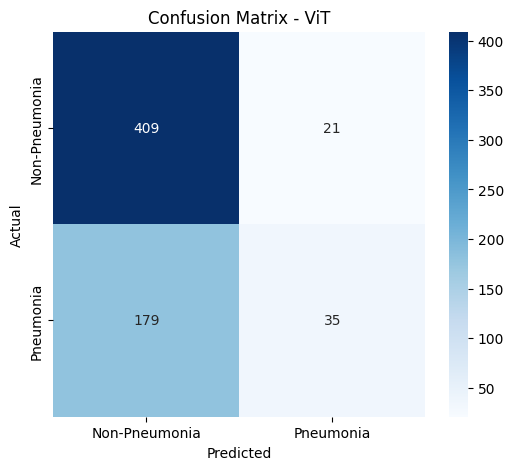

In [57]:
cm = confusion_matrix(targets, preds)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=[
        "Non-Pneumonia",
        "Pneumonia"
    ],
    yticklabels=[
        "Non-Pneumonia",
        "Pneumonia"
    ]
)

plt.title("Confusion Matrix - ViT")

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.show()

In [58]:
torch.save(
    model.state_dict(),
    "/kaggle/working/vit_model.pth"
)

print("ViT model saved successfully")

ViT model saved successfully


In [66]:
def generate_vit_gradcam(model, image, target_layer):

    gradients = []
    activations = []

    def forward_hook(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0])

    forward_handle = target_layer.register_forward_hook(forward_hook)

    backward_handle = target_layer.register_full_backward_hook(backward_hook)

    output = model(image)

    model.zero_grad()

    output.backward()

    grad = gradients[0][0].cpu().detach().numpy()

    act = activations[0][0].cpu().detach().numpy()

    grad = grad[1:]
    act = act[1:]

    weights = np.mean(grad, axis=1)

    cam = np.zeros(act.shape[0])

    for i, w in enumerate(weights):
        cam[i] = np.mean(act[i]) * w

    size = int(np.sqrt(len(cam)))

    cam = cam.reshape(size, size)

    cam = cv2.resize(cam, (224,224))

    cam = np.maximum(cam, 0)

    cam = cam - cam.min()

    cam = cam / (cam.max() + 1e-8)

    forward_handle.remove()
    backward_handle.remove()

    return cam

In [67]:
images, labels = next(iter(test_loader))

img = images[0].unsqueeze(0).to(device)

cam = generate_vit_gradcam(
    model,
    img,
    model.encoder.layers[-1].ln_1
)

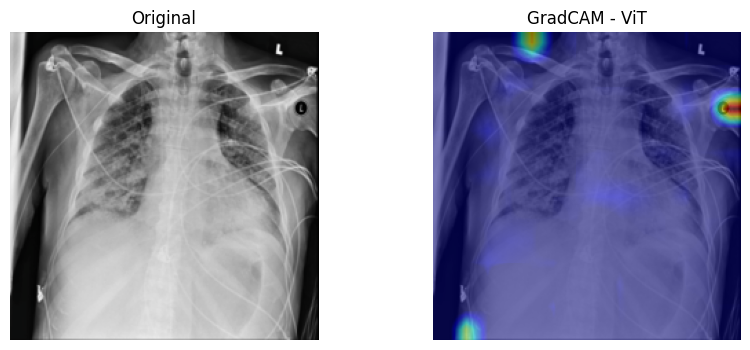

In [68]:
img_np = images[0].permute(1,2,0).numpy()

img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])

img_np = np.clip(img_np, 0, 1)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(img_np)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img_np)
plt.imshow(cam, cmap="jet", alpha=0.5)
plt.title("GradCAM - ViT")
plt.axis("off")

plt.show()

In [69]:
!pip install lime -q

In [70]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [71]:
explainer = lime_image.LimeImageExplainer()

def predict_fn(images):

    images = torch.tensor(images).permute(0,3,1,2).float().to(device)

    outputs = model(images)

    probs = torch.sigmoid(outputs).detach().cpu().numpy()

    return np.concatenate([1-probs, probs], axis=1)

In [72]:
image = images[0].permute(1,2,0).numpy()

explanation = explainer.explain_instance(
    image,
    predict_fn,
    top_labels=1,
    hide_color=0,
    num_samples=1000
)

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5877128].


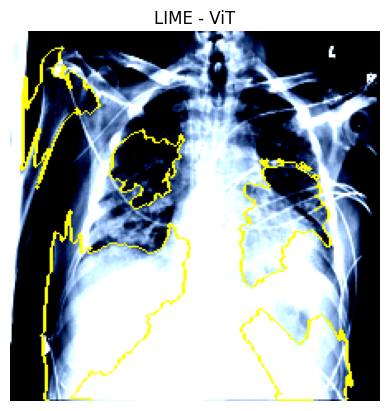

In [73]:
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)

plt.imshow(mark_boundaries(temp, mask))

plt.title("LIME - ViT")

plt.axis("off")

plt.show()

In [74]:
def integrated_gradients(model, image, baseline=None, steps=50):

    model.eval()

    image = image.clone().detach().to(device)

    if baseline is None:
        baseline = torch.zeros_like(image).to(device)

    total_gradients = torch.zeros_like(image)

    for i in range(1, steps + 1):

        alpha = i / steps

        scaled = baseline + alpha * (image - baseline)

        scaled.requires_grad_(True)

        output = model(scaled)

        score = output[0,0]

        model.zero_grad()

        score.backward()

        total_gradients += scaled.grad.detach()

    avg_gradients = total_gradients / steps

    integrated = (image - baseline) * avg_gradients

    ig = integrated.squeeze().cpu().numpy()

    ig = np.max(np.abs(ig), axis=0)

    ig = (ig - ig.min()) / (ig.max() - ig.min() + 1e-8)

    return ig

In [75]:
images, labels = next(iter(test_loader))

img = images[0].unsqueeze(0)

ig_map = integrated_gradients(model, img)

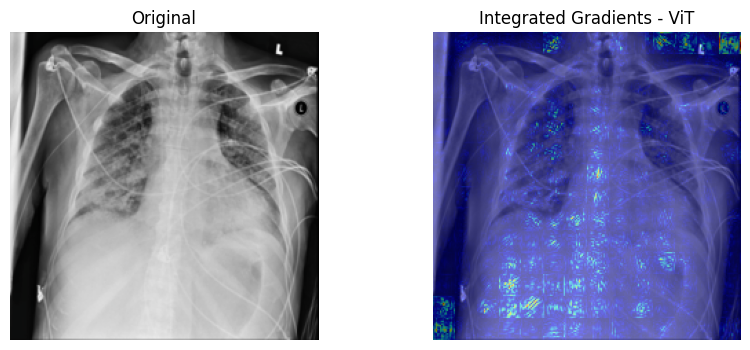

In [76]:
img_np = images[0].permute(1,2,0).numpy()
img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
img_np = np.clip(img_np, 0, 1)
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(img_np)
plt.title("Original")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(img_np)
plt.imshow(ig_map, cmap="jet", alpha=0.5)
plt.title("Integrated Gradients - ViT")
plt.axis("off")
plt.show()

In [84]:
features = []

def hook_fn(module, input, output):
    features.append(output.detach())

In [85]:
hook = model.encoder.layers[-1].ln_1.register_forward_hook(hook_fn)

In [86]:
images, labels = next(iter(test_loader))
img = images[0].unsqueeze(0).to(device)
_ = model(img)

In [87]:
feat = features[0][0].cpu().numpy()
feat = feat[1:]
attention_map = np.mean(feat, axis=1)
size = int(np.sqrt(len(attention_map)))
attention_map = attention_map.reshape(size, size)
attention_map = cv2.resize(attention_map, (224,224))
attention_map = attention_map - attention_map.min()
attention_map = attention_map / (attention_map.max() + 1e-8)

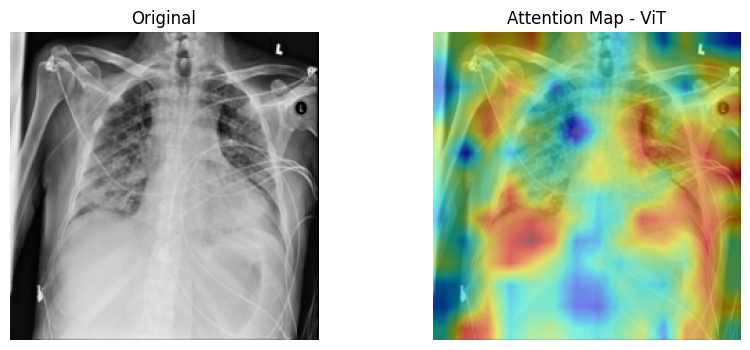

In [88]:
img_np = images[0].permute(1,2,0).numpy()
img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
img_np = np.clip(img_np, 0, 1)
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(img_np)
plt.title("Original")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(img_np)
plt.imshow(attention_map, cmap="jet", alpha=0.5)
plt.title("Attention Map - ViT")
plt.axis("off")
plt.show()